In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import os

def detect_background_color(img, samples_per_edge=100):
    """
    Safely detect the background color by analyzing image edges.
    Uses a more robust sampling approach that avoids zero-step slicing.
    
    Args:
        img: Input image in BGR format
        samples_per_edge: Number of samples to take from each edge
        
    Returns:
        tuple: RGB color values of detected background
    """
    height, width = img.shape[:2]
    
    # Ensure we take at least one sample per edge
    samples_per_edge = max(1, min(samples_per_edge, min(height, width)))
    
    # Calculate step sizes (ensure non-zero)
    width_step = max(1, width // samples_per_edge)
    height_step = max(1, height // samples_per_edge)
    
    # Sample pixels from edges
    edge_pixels = []
    
    # Sample top and bottom edges
    for x in range(0, width, width_step):
        edge_pixels.append(img[0, x])        # Top edge
        edge_pixels.append(img[-1, x])       # Bottom edge
    
    # Sample left and right edges
    for y in range(0, height, height_step):
        edge_pixels.append(img[y, 0])        # Left edge
        edge_pixels.append(img[y, -1])       # Right edge
    
    # Convert to numpy array
    edge_pixels = np.array(edge_pixels)
    
    # Use K-means clustering to find dominant color
    kmeans = KMeans(n_clusters=3, n_init=10)
    kmeans.fit(edge_pixels)
    
    # Get the most frequent color cluster
    unique, counts = np.unique(kmeans.labels_, return_counts=True)
    dominant_cluster = unique[np.argmax(counts)]
    background_color = kmeans.cluster_centers_[dominant_cluster].astype(int)
    
    # Convert from BGR to RGB
    return tuple(background_color[::-1])

def detect_shadows_enhanced(img, background_color):
    """
    Enhanced shadow detection that preserves subtle lighting transitions and reflections.
    This function analyzes both global and local lighting patterns to identify shadows
    while being careful not to misclassify object details as shadows.
    
    Args:
        img: Input image in BGR format
        background_color: RGB tuple of the background color
    Returns:
        numpy.ndarray: Shadow mask where 1 indicates shadow pixels
    """
    # First, convert background color from RGB to BGR for OpenCV
    bg_color = background_color[::-1]
    
    # Create a background image matching our detected background color
    background = np.full_like(img, bg_color)
    
    # Convert both images to LAB color space for better lighting analysis
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    bg_lab = cv2.cvtColor(background, cv2.COLOR_BGR2LAB)
    
    # Extract L (lightness) channels
    l_img = lab[:,:,0].astype(np.float32)
    l_bg = bg_lab[:,:,0].astype(np.float32)
    
    # Calculate local average of lightness using multiple scales
    shadow_masks = []
    for kernel_size in [(21, 21), (41, 41)]:  # Multiple scales for different shadow sizes
        # Calculate local lightness average
        local_mean = cv2.GaussianBlur(l_img, kernel_size, 0)
        
        # Calculate lightness difference from background
        l_diff = np.abs(l_img - l_bg)
        local_diff = np.abs(local_mean - l_bg)
        
        # Create adaptive threshold based on local contrast
        threshold = np.mean(l_diff) * 0.5 + local_diff * 0.2
        
        # Identify shadow regions
        shadow = (l_diff < threshold) & (l_img < l_bg)
        shadow_masks.append(shadow)
    
    # Combine shadow masks from different scales
    shadow_mask = np.logical_or.reduce(shadow_masks)
    
    # Analyze color differences to prevent misclassifying colored regions as shadows
    a_diff = np.abs(lab[:,:,1] - bg_lab[:,:,1])
    b_diff = np.abs(lab[:,:,2] - bg_lab[:,:,2])
    color_diff = np.sqrt(a_diff**2 + b_diff**2)
    
    # Only keep shadow pixels where color difference is small
    shadow_mask &= (color_diff < 30)
    
    # Clean up the mask
    kernel = np.ones((3,3), np.uint8)
    shadow_mask = cv2.morphologyEx(shadow_mask.astype(np.uint8), 
                                 cv2.MORPH_CLOSE, kernel)
    shadow_mask = cv2.morphologyEx(shadow_mask.astype(np.uint8), 
                                 cv2.MORPH_OPEN, kernel)
    
    return shadow_mask

def refined_background_removal(image_input, background_color=None, edge_smoothing=5, preserve_whites=True):
    """
    Advanced background removal with automatic background color detection and
    improved edge handling.
    
    Args:
        image_path: Path to input image
        background_color: RGB tuple or None for auto-detection
        edge_smoothing: Amount of edge smoothing (higher = smoother)
        preserve_whites: Whether to preserve white colors in the object
    """
    def create_color_range_mask(img, target_color, tolerance=20):  # Reduced tolerance
        """Create a more precise mask for colors within tolerance of target color"""
        target_bgr = target_color[::-1]

        # Convert to LAB color space for better color similarity matching
        lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        lab_target = cv2.cvtColor(np.uint8([[target_bgr]]), cv2.COLOR_BGR2LAB)[0,0]

        # Create bounds with tolerance in LAB space
        lower_bound = np.array([max(0, c - tolerance) for c in lab_target])
        upper_bound = np.array([min(255, c + tolerance) for c in lab_target])

        # Create mask in LAB space
        mask = cv2.inRange(lab_image, lower_bound, upper_bound)

        # Clean up the mask
        kernel = np.ones((3,3), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

        return mask

    def smooth_edges(mask, smooth_factor):
        """Apply edge smoothing with outline removal"""
        # Convert to float
        mask_float = mask.astype(np.float32) / 255.0
        
        # Apply erosion first to remove thin outlines
        kernel = np.ones((2,2), np.uint8)
        eroded = cv2.erode(mask_float, kernel, iterations=1)
        
        # Multi-scale smoothing
        smoothed = np.zeros_like(mask_float)
        weights_sum = 0
        
        for i in range(1, 4):
            kernel_size = smooth_factor * 2 * i + 1
            current_smooth = cv2.GaussianBlur(eroded, 
                                            (kernel_size, kernel_size), 
                                            0)
            weight = 1.0 / i
            smoothed += current_smooth * weight
            weights_sum += weight
        
        smoothed /= weights_sum
        
        # Threshold the result to make edges cleaner
        smoothed = np.where(smoothed > 0.5, 1.0, 0.0)
        
        return (smoothed * 255).astype(np.uint8)

    def preserve_white_details(img, mask, threshold=250):  # Increased threshold
        """Preserve white details with stricter thresholds"""
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Create more strict adaptive threshold
        local_mean = cv2.GaussianBlur(gray, (15, 15), 0)
        local_threshold = threshold - (255 - local_mean) * 0.05  # Reduced influence of local mean
        white_areas = gray > local_threshold
        
        # Reduce connectivity to main object
        kernel = np.ones((2,2), np.uint8)  # Smaller kernel
        dilated_mask = cv2.dilate(mask, kernel, iterations=1)  # Fewer iterations
        preserved_whites = white_areas & dilated_mask
        
        # Clean up artifacts
        preserved_whites = cv2.morphologyEx(preserved_whites.astype(np.uint8), 
                                        cv2.MORPH_OPEN, kernel)  # Use OPEN first
        preserved_whites = cv2.morphologyEx(preserved_whites, 
                                        cv2.MORPH_CLOSE, kernel)
        
        return mask | preserved_whites

    def shrink_mask(mask, shrink_percent=1):
        """
        Shrink the mask by a percentage of its dimensions
        Args:
            mask: Binary mask
            shrink_percent: Percentage to shrink (1 = 1%)
        Returns:
            Shrunk mask
        """
        # Get mask dimensions
        height, width = mask.shape[:2]
        
        # Calculate pixels to shrink on each side
        shrink_pixels_y = int(height * (shrink_percent / 100))
        shrink_pixels_x = int(width * (shrink_percent / 100))
        
        # Ensure at least 1 pixel if percentage is too small
        shrink_pixels_y = max(1, shrink_pixels_y)
        shrink_pixels_x = max(1, shrink_pixels_x)
        
        # Create structuring element for erosion
        kernel = cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (2 * shrink_pixels_x + 1, 2 * shrink_pixels_y + 1)
        )
        
        # Erode the mask
        shrunk_mask = cv2.erode(mask, kernel, iterations=1)
        
        return shrunk_mask

    # Main processing pipeline
    try:
        print("Loading image...")
        # Input validation and conversion
        if isinstance(image_input, str):
            print("It's a file path - load the image")
            if not os.path.exists(image_input):
                raise ValueError(f"Image file not found: {image_input}")
            image = cv2.imread(image_input)
            if image is None:
                raise ValueError(f"Failed to load image from {image_input}")
        elif isinstance(image_input, np.ndarray):
            print("It's already a numpy array - verify format")
            if len(image_input.shape) != 3 or image_input.shape[2] != 3:
                raise ValueError("Image array must be a 3-channel color image")
            image = image_input
        elif isinstance(image_input, Image.Image):
            
            print("Convert PIL Image to numpy array in BGR format")
            image_array = np.array(image_input)
            image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
        else:
            raise TypeError("Image input must be either a file path, numpy array, or PIL Image")
        
        # Handle background color detection
        if background_color is None:
            print("Detecting background color...")
            detected_color = detect_background_color(image)
            print(f"Detected background color (RGB): {detected_color}")
            bg_color = detected_color
        else:
            bg_color = background_color
        
        print("Detecting shadows...")
        shadow_mask = detect_shadows_enhanced(image, bg_color)
        
        print("Creating color-based mask...")
        color_mask = create_color_range_mask(image, bg_color)
        
        # Combine color and shadow masks
        combined_mask = (color_mask | shadow_mask)

        
        
        # Invert mask (we want to keep the object, not the background)
        object_mask = cv2.bitwise_not(combined_mask)
        
        # Preserve white details if requested
        if preserve_whites:
            print("Preserving white details...")
            object_mask = preserve_white_details(image, object_mask)

        
        # Apply edge smoothing
        if edge_smoothing > 0:
            print("Smoothing edges...")
            object_mask = smooth_edges(object_mask, edge_smoothing)

        # Shrinking mask
        print("Shrinking mask...")
        object_mask = shrink_mask(object_mask, shrink_percent=0.5)
        
        
        # Create output images
        alpha = object_mask
        rgba = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
        rgba[:, :, 3] = alpha
        
        result = image.copy()
        result[alpha == 0] = [0, 0, 0]
        
        # Convert to RGB for display
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
        
        # Enhanced visualization to show shadow detection
        plt.figure(figsize=(20, 3))
        
        plt.subplot(151)
        plt.imshow(image_rgb)
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(152)
        plt.imshow(shadow_mask, cmap='gray')
        plt.title('Shadow Mask')
        plt.axis('off')
        
        plt.subplot(153)
        plt.imshow(object_mask, cmap='gray')
        plt.title('Final Mask')
        plt.axis('off')
        
        plt.subplot(154)
        plt.imshow(result_rgb)
        plt.title('Result (Black Background)')
        plt.axis('off')
        
        # Display with checkered background
        plt.subplot(155)
        checkered = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)
        checkered[::20, ::20] = [200, 200, 200]
        checkered[10::20, 10::20] = [200, 200, 200]
        
        alpha_3d = alpha[:,:,np.newaxis] / 255.0
        blended = (image_rgb * alpha_3d + checkered * (1 - alpha_3d)).astype(np.uint8)
        plt.imshow(blended)
        plt.title('Result (Transparent)')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()


        plt.imshow(result_rgb)
        plt.title('Result (Transparent)')
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        return image_rgb, alpha, result_rgb, blended, rgba
    
    except Exception as e:
        print(f"Error during processing: {str(e)}")
        return None

# Example usage:
if __name__ == "__main__":
    try:
        results = refined_background_removal(
            "../static/uploads/Chair/front.jpg",
            background_color=None,  # Enable auto-detection
            edge_smoothing=5,
            preserve_whites=True
        )
    except Exception as e:
        print(f"Failed to process image: {str(e)}")

In [ ]:
import torch
import os
import cv2
import numpy as np
from PIL import Image
import plotly.graph_objects as go
from transformers import pipeline
# from models.refined_background_removal import refined_background_removal

def load_and_normalize_images(image_paths):
    """
    Load and normalize all images to the same size while maintaining aspect ratios.
    We first determine the target size based on the smallest image dimension,
    then resize all images accordingly with proper padding.
    """
    print("\nLoading and normalizing images...")
    
    # First, load all images and get their dimensions
    images = {}
    dimensions = []
    for view_type, path in image_paths.items():
        img = cv2.imread(path)
        if img is None:
            raise ValueError(f"Failed to load image: {path}")
        images[view_type] = img
        dimensions.append(img.shape[:2])
        print(f"{view_type.capitalize()} view original size: {img.shape[1]}x{img.shape[0]}")
    
    # Find the smallest dimension across all images
    min_dim = min(min(dim) for dim in dimensions)
    # Round to nearest multiple of 32 (common requirement for deep learning models)
    target_size = ((min_dim // 32) * 32)
    print(f"\nTarget size determined: {target_size}x{target_size}")
    
    normalized_images = {}
    for view_type, img in images.items():
        # Calculate aspect ratio preserving dimensions
        h, w = img.shape[:2]
        aspect = w / h
        
        if aspect > 1:
            new_w = target_size
            new_h = int(target_size / aspect)
        else:
            new_h = target_size
            new_w = int(target_size * aspect)
            
        # Resize image
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        
        # Create square canvas with padding
        square_img = np.zeros((target_size, target_size, 3), dtype=np.uint8)
        
        # Calculate padding to center the image
        pad_y = (target_size - new_h) // 2
        pad_x = (target_size - new_w) // 2
        
        # Place resized image in center
        square_img[pad_y:pad_y+new_h, pad_x:pad_x+new_w] = resized
        
        normalized_images[view_type] = square_img
        print(f"{view_type.capitalize()} view normalized size: {square_img.shape[1]}x{square_img.shape[0]}")
    
    return normalized_images, target_size

def create_object_mesh(image_input, depth_threshold=0.75):
    """
    Creates a 3D mesh from either an image path or a numpy array using refined background removal.
    The function works directly with image data without saving temporary files.
    
    Args:
        image_input: Can be either a file path (str), PIL Image, or a numpy array
        depth_threshold: Threshold for depth filtering (0.0 to 1.0)
    """
    # Input validation and conversion
    if isinstance(image_input, str):
        # It's a file path - load the image
        if not os.path.exists(image_input):
            raise ValueError(f"Image file not found: {image_input}")
        image = cv2.imread(image_input)
        if image is None:
            raise ValueError(f"Failed to load image from {image_input}")
    elif isinstance(image_input, np.ndarray):
        # It's already a numpy array - verify format
        if len(image_input.shape) != 3 or image_input.shape[2] != 3:
            raise ValueError("Image array must be a 3-channel color image")
        image = image_input
    elif isinstance(image_input, Image.Image):
        # Convert PIL Image to numpy array in BGR format
        image_array = np.array(image_input)
        image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
    else:
        raise TypeError("Image input must be either a file path, numpy array, or PIL Image")

    try:
        # Apply refined background removal directly to the image
        # Note: refined_background_removal expects BGR input and returns RGB output
        _, alpha_mask, result_rgb, _, _ = refined_background_removal(image)
        
        # Get depth map using Depth Anything model
        device = "cuda" if torch.cuda.is_available() else "cpu"
        depth_model = pipeline("depth-estimation", model="depth-anything/Depth-Anything-V2-base-hf", device=device)
        
        # Use result_rgb directly for depth estimation (it's already in RGB format)
        image_pil = Image.fromarray(result_rgb)
        depth_predictions = depth_model(image_pil)
        depth_map = np.array(depth_predictions["depth"])
        
        # Process depth map with dimensions from result_rgb
        height, width = result_rgb.shape[:2]
        depth_map_resized = cv2.resize(depth_map, (width, height))
        
        # Apply alpha mask to depth map
        alpha_mask_resized = cv2.resize(alpha_mask, (depth_map_resized.shape[1], depth_map_resized.shape[0]))

        # depth_mask = alpha_mask_resized > 0
        # depth_edges = np.zeros_like(depth_map_resized)
        # depth_edges[depth_mask] = depth_map_resized[depth_mask]
        # depth_edges_smoothed = cv2.GaussianBlur(depth_edges, (5, 5), 0)
        
        fig_dynamic, total_points = create_dynamic_scatter_visualization(depth_map, result_rgb, "create_clean_scatter_visualization")
        print("Create mesh complete!!!, total added points: ", total_points)
        return fig_dynamic
        
    except Exception as e:
        print(f"Error during mesh creation: {str(e)}")
        return None
    
def create_dynamic_scatter_visualization(depth_map, image, title, target_size=100):
    """
    Creates a 3D scatter visualization where the number of vertical points
    is determined dynamically based on the depth range at each location.
    """
    # Normalize dimensions as before
    height, width = depth_map.shape
    scale_factor = target_size / max(width, height)
    
    new_width = int(width * scale_factor)
    new_height = int(height * scale_factor)
    
    # Resize our maps
    depth_norm = cv2.resize(depth_map, (new_width, new_height))
    image_resized = cv2.resize(image, (new_width, new_height))
    
    # Create mask for valid points
    valid_mask = ~np.all(image_resized == 0, axis=2)
    
    # Normalize depth values
    depth_norm = depth_norm / depth_norm.max() * target_size
    
    # Find the global minimum depth (highest point in 3D space) among valid points
    global_min_depth = np.min(depth_norm[valid_mask])
    
    # Initialize our point collections
    x_all = []
    y_all = []
    z_all = []
    colors_all = []
    
    # Process each valid point
    for i in range(new_height):
        for j in range(new_width):
            if valid_mask[i, j]:
                # Get the current point's depth
                current_depth = depth_norm[i, j]
                
                # Calculate how many points we need for this vertical line
                # The number of points is proportional to the distance from the global minimum
                depth_difference = current_depth - global_min_depth
                
                # We'll use one point per unit of depth difference
                # This ensures we have exactly the right number of points needed
                num_points = max(1, int(depth_difference))
                
                if num_points > 1:  # Only create vertical line if there's a meaningful depth difference
                    # Create evenly spaced points from current depth to the global minimum
                    z_points = np.linspace(current_depth, global_min_depth, num_points)
                    
                    # Add these points to our collections
                    x_all.extend([j] * num_points)
                    y_all.extend([i] * num_points)
                    z_all.extend(z_points)
                    
                    # Use the original color for all points in this line
                    original_color = image_resized[i, j]
                    colors_all.extend([original_color] * num_points)
                else:
                    # For points at or near the minimum depth, just add a single point
                    x_all.append(j)
                    y_all.append(i)
                    z_all.append(current_depth)
                    colors_all.append(image_resized[i, j])
    
    # Convert to numpy arrays
    x_all = np.array(x_all)
    y_all = np.array(y_all)
    z_all = np.array(z_all)
    colors_all = np.array(colors_all)
    
    # Create color strings
    color_strings = [f'rgb({r},{g},{b})' for r,g,b in colors_all]
    
    # Create the visualization
    fig = go.Figure(data=[go.Scatter3d(
        x=x_all,
        y=y_all,
        z=z_all,
        mode='markers',
        marker=dict(
            size=2,
            color=color_strings,
            opacity=1.0
        )
    )])
    
    # Update layout
    fig.update_layout(
        title=dict(
            text=f"{title}\nPoints distributed based on depth difference",
            x=0.5,
            y=0.95,
            xanchor='center',
            yanchor='top',
            font=dict(size=20)
        ),
        scene=dict(
            xaxis=dict(
                range=[0, new_width],
                nticks=10,
                title='Width',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            ),
            yaxis=dict(
                range=[0, new_height],
                nticks=10,
                title='Height',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            ),
            zaxis=dict(
                range=[0, target_size],
                nticks=10,
                title='Depth',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            )
        ),
        width=800,
        height=800,
        showlegend=False,
        paper_bgcolor='white'
    )
    
    return fig, len(x_all)  # Return point count for information


def combine_front_back_meshes(front_fig, back_fig, depth_threshold=0.25, sampling_rate=0.5):
    """
    Creates an optimized 3D visualization combining front and back mesh views.
    
    Args:
        front_fig: Plotly figure of front mesh
        back_fig: Plotly figure of back mesh
        depth_threshold: Depth threshold value
        sampling_rate: Fraction of points to keep (0.0 to 1.0)
    """
    def extract_points(fig):
        if fig is None or not fig.data:
            return [], [], [], []
        trace = fig.data[0]
        return (
            np.array(trace.x), 
            np.array(trace.y), 
            np.array(trace.z), 
            [c.strip('rgb()').split(',') for c in trace.marker.color]
        )
    
    def sample_points(x, y, z, colors, rate):
        """Efficiently sample points using numpy"""
        n_points = len(x)
        n_sample = int(n_points * rate)
        if n_sample >= n_points:
            return x, y, z, colors
        
        # Use numpy's random choice for efficient sampling
        indices = np.random.choice(n_points, n_sample, replace=False)
        indices.sort()  # Sort for better memory access patterns
        
        return (x[indices], y[indices], z[indices],
                [colors[i] for i in indices])
    
    # Extract points and convert to numpy arrays for faster processing
    front_x, front_y, front_z, front_colors = extract_points(front_fig)
    back_x, back_y, back_z, back_colors = extract_points(back_fig)
    
    # # Sample points if needed
    # front_x, front_y, front_z, front_colors = sample_points(
    #     front_x, front_y, front_z, front_colors, sampling_rate)
    # back_x, back_y, back_z, back_colors = sample_points(
    #     back_x, back_y, back_z, back_colors, sampling_rate)
    
    # Calculate dimensions using numpy operations
    original_width = max(np.max(front_x), np.max(back_x))
    original_height = max(np.max(front_y), np.max(back_y))

    print("origina width: ",original_width,  "original_height: ", original_height)
    aspect_ratio = original_width / original_height
    
    # Center views using vectorized operations
    front_width = np.max(front_x) - np.min(front_x)
    back_width = np.max(back_x) - np.min(back_x)
    
    front_x_centered = front_x - np.min(front_x) - front_width/2
    back_x_centered = -(back_x - np.min(back_x) - back_width/2)

    front_y_centered = front_y - np.min(front_y) - front_width/2
    back_y_centered = -(back_y - np.min(back_y) - back_width/2)
    
    # Normalize z-coordinates using vectorized operations
    front_z_norm = 0.5 + (front_z - np.min(front_z)) * depth_threshold / (np.max(front_z) - np.min(front_z))
    back_z_norm = 0.5 - (back_z - np.min(back_z)) * depth_threshold / (np.max(back_z) - np.min(back_z))
    
    # Convert colors to RGB strings efficiently
    def process_colors(colors):
        return [f'rgb({",".join(c)})' for c in colors]
    
    front_colors_processed = process_colors(front_colors)
    back_colors_processed = process_colors(back_colors)
    
    # Combine points using numpy concatenation
    combined_x = np.concatenate([front_x_centered, back_x_centered])
    combined_y = np.concatenate([front_y, back_y])
    combined_z = np.concatenate([front_z_norm, back_z_norm])
    combined_colors = front_colors_processed + back_colors_processed
    
    # Create the figure
    combined_fig = go.Figure(data=[go.Scatter3d(
        x=combined_x,
        y=combined_y,
        z=combined_z,
        mode='markers',
        marker=dict(
            size=2,
            color=combined_colors,
            opacity=1
        ),
        showlegend=False
    )])
    
    # Update layout with minimal settings
    combined_fig.update_layout(
        scene=dict(
            aspectratio=dict(x=1, y=1/aspect_ratio, z=0.5),
            aspectmode='manual',
            camera=dict(
                eye=dict(x=1.25, y=-0.25, z=1.25),
                up=dict(x=0, y=0, z=0),
                center=dict(x=0, y=0, z=0)
            ),
            xaxis=dict(
                range=[-original_width/2, original_width/2],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            ),
            yaxis=dict(
                range=[0, original_height],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            ),
            zaxis=dict(
                range=[0, 1],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            )
        ),
        uirevision='true',
        showlegend=False,
        margin=dict(l=0, r=0, t=0, b=0, pad=0),
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)'
    )
    
    return combined_fig



def process_orthogonal_views(front, back=None, top=None, depth_threshold=0.0, sampling_rate=1.0):
    # Process all three views
    image_paths = {
        'front': f"{front}",
        'back': f"{back}",
        'top': f"{top}"
    }

    # First normalize all images
    try:
        normalized_images, target_size = load_and_normalize_images(image_paths)
        print("\nAll images successfully normalized to size:", target_size)

        # First, let's get our three normalized meshes individually
        front_fig = create_object_mesh(image_paths['front'], depth_threshold=depth_threshold)
        back_fig = create_object_mesh(image_paths['back'], depth_threshold=depth_threshold)
        # top_fig = create_object_mesh(image_paths['top'], depth_threshold=depth_threshold)

         # For maximum quality (but slower)
        combined_mesh = combine_front_back_meshes(front_fig, back_fig, sampling_rate=sampling_rate)
        combined_mesh.show()
        return combined_mesh.to_dict()
    
    except Exception as e:
        print(f"Error during image normalization: {str(e)}")
        return None



# for single image
def process_image(image_path, depth_threshold=0.0):
    # First normalize all images
    image_paths = {
        'front': f"{image_path}"
    }
    try:
        normalized_images, target_size = load_and_normalize_images(image_paths)
        print("\nAll images successfully normalized to size:", target_size)

        # First, let's get our three normalized meshes individually
        front_fig = create_object_mesh(image_paths['front'], depth_threshold=depth_threshold)

        if front_fig is not None:
            front_fig.update_layout(
                title=dict(
                    text=f"3D Mesh - front View (Size: {target_size}x{target_size})",
                    y=0.95
                )
            )
            front_fig.show()
        else:
            print(f"Failed to create mesh for front view")
    except Exception as e:
        print(f"Error during image normalization: {str(e)}")

    # Convert the Plotly figure to JSON-serializable format
    # return front_fig.to_dict()  # This converts the Plotly figure to a dictionary


process_orthogonal_views("../static/uploads/Chair/front.jpg", "../static/uploads/Chair/back.jpg", "../static/uploads/Chair/front.jpg")

In [3]:
def create_dynamic_scatter_visualization(depth_map, image, title, target_size=100):
    """
    Creates a 3D scatter visualization where the number of vertical points
    is determined dynamically based on the depth range at each location.
    """
    # Normalize dimensions as before
    height, width = depth_map.shape
    scale_factor = target_size / max(width, height)
    
    new_width = int(width * scale_factor)
    new_height = int(height * scale_factor)
    
    # Resize our maps
    depth_norm = cv2.resize(depth_map, (new_width, new_height))
    image_resized = cv2.resize(image, (new_width, new_height))
    
    # Create mask for valid points
    valid_mask = ~np.all(image_resized == 0, axis=2)
    
    # Normalize depth values
    depth_norm = depth_norm / depth_norm.max() * target_size
    
    # Find the global minimum depth (highest point in 3D space) among valid points
    global_min_depth = np.min(depth_norm[valid_mask])
    
    # Initialize our point collections
    x_all = []
    y_all = []
    z_all = []
    colors_all = []
    
    # Process each valid point
    for i in range(new_height):
        for j in range(new_width):
            if valid_mask[i, j]:
                # Get the current point's depth
                current_depth = depth_norm[i, j]
                
                # Calculate how many points we need for this vertical line
                # The number of points is proportional to the distance from the global minimum
                depth_difference = current_depth - global_min_depth
                
                # We'll use one point per unit of depth difference
                # This ensures we have exactly the right number of points needed
                num_points = max(1, int(depth_difference))
                
                if num_points > 1:  # Only create vertical line if there's a meaningful depth difference
                    # Create evenly spaced points from current depth to the global minimum
                    z_points = np.linspace(current_depth, global_min_depth, num_points)
                    
                    # Add these points to our collections
                    x_all.extend([j] * num_points)
                    y_all.extend([i] * num_points)
                    z_all.extend(z_points)
                    
                    # Use the original color for all points in this line
                    original_color = image_resized[i, j]
                    colors_all.extend([original_color] * num_points)
                else:
                    # For points at or near the minimum depth, just add a single point
                    x_all.append(j)
                    y_all.append(i)
                    z_all.append(current_depth)
                    colors_all.append(image_resized[i, j])
    
    # Convert to numpy arrays
    x_all = np.array(x_all)
    y_all = np.array(y_all)
    z_all = np.array(z_all)
    colors_all = np.array(colors_all)
    
    # Create color strings
    color_strings = [f'rgb({r},{g},{b})' for r,g,b in colors_all]
    
    # Create the visualization
    fig = go.Figure(data=[go.Scatter3d(
        x=x_all,
        y=y_all,
        z=z_all,
        mode='markers',
        marker=dict(
            size=2,
            color=color_strings,
            opacity=1.0
        )
    )])
    
    # Update layout
    fig.update_layout(
        title=dict(
            text=f"{title}\nPoints distributed based on depth difference",
            x=0.5,
            y=0.95,
            xanchor='center',
            yanchor='top',
            font=dict(size=20)
        ),
        scene=dict(
            xaxis=dict(
                range=[0, new_width],
                nticks=10,
                title='Width',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            ),
            yaxis=dict(
                range=[0, new_height],
                nticks=10,
                title='Height',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            ),
            zaxis=dict(
                range=[0, target_size],
                nticks=10,
                title='Depth',
                gridcolor='lightgray',
                showbackground=True,
                backgroundcolor='white'
            )
        ),
        width=800,
        height=800,
        showlegend=False,
        paper_bgcolor='white'
    )
    
    return fig, len(x_all)  # Return point count for information

In [4]:
def create_object_mesh(image_input, depth_threshold=0.75):
    """
    Creates a 3D mesh from either an image path or a numpy array using refined background removal.
    The function works directly with image data without saving temporary files.
    
    Args:
        image_input: Can be either a file path (str), PIL Image, or a numpy array
        depth_threshold: Threshold for depth filtering (0.0 to 1.0)
    """
    # Input validation and conversion
    if isinstance(image_input, str):
        # It's a file path - load the image
        if not os.path.exists(image_input):
            raise ValueError(f"Image file not found: {image_input}")
        image = cv2.imread(image_input)
        if image is None:
            raise ValueError(f"Failed to load image from {image_input}")
    elif isinstance(image_input, np.ndarray):
        # It's already a numpy array - verify format
        if len(image_input.shape) != 3 or image_input.shape[2] != 3:
            raise ValueError("Image array must be a 3-channel color image")
        image = image_input
    elif isinstance(image_input, Image.Image):
        # Convert PIL Image to numpy array in BGR format
        image_array = np.array(image_input)
        image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
    else:
        raise TypeError("Image input must be either a file path, numpy array, or PIL Image")

    try:
        # Apply refined background removal directly to the image
        # Note: refined_background_removal expects BGR input and returns RGB output
        _, alpha_mask, result_rgb, _, _ = refined_background_removal(image)
        
        # Get depth map using Depth Anything model
        device = "cuda" if torch.cuda.is_available() else "cpu"
        depth_model = pipeline("depth-estimation", model="depth-anything/Depth-Anything-V2-base-hf", device=device)
        
        # Use result_rgb directly for depth estimation (it's already in RGB format)
        image_pil = Image.fromarray(result_rgb)
        depth_predictions = depth_model(image_pil)
        depth_map = np.array(depth_predictions["depth"])
        
        # Process depth map with dimensions from result_rgb
        height, width = result_rgb.shape[:2]
        depth_map_resized = cv2.resize(depth_map, (width, height))
        
        # Apply alpha mask to depth map
        alpha_mask_resized = cv2.resize(alpha_mask, (depth_map_resized.shape[1], depth_map_resized.shape[0]))

        # depth_mask = alpha_mask_resized > 0
        # depth_edges = np.zeros_like(depth_map_resized)
        # depth_edges[depth_mask] = depth_map_resized[depth_mask]
        # depth_edges_smoothed = cv2.GaussianBlur(depth_edges, (5, 5), 0)
        
        fig_dynamic, total_points = create_dynamic_scatter_visualization(depth_map, result_rgb, "create_clean_scatter_visualization")
        print("Create mesh complete!!!, total added points: ", total_points)
        return fig_dynamic
        
    except Exception as e:
        print(f"Error during mesh creation: {str(e)}")
        return None

In [5]:
def combine_front_back_meshes(front_fig, back_fig, depth_threshold=0.25, sampling_rate=0.5):
    """
    Creates a 3D visualization combining front and back mesh views while preserving true depth proportions.
    
    Args:
        front_fig: Plotly figure of front mesh
        back_fig: Plotly figure of back mesh
        depth_threshold: Overall depth scale factor
        sampling_rate: Fraction of points to keep (0.0 to 1.0)
    """
    def extract_points(fig):
        if fig is None or not fig.data:
            return [], [], [], []
        trace = fig.data[0]
        return (
            np.array(trace.x), 
            np.array(trace.y), 
            np.array(trace.z), 
            [c.strip('rgb()').split(',') for c in trace.marker.color]
        )
    # Convert colors to RGB strings efficiently
    def process_colors(colors):
        return [f'rgb({",".join(c)})' for c in colors]
    
    # Extract points from both views
    front_x, front_y, front_z, front_colors = extract_points(front_fig)
    back_x, back_y, back_z, back_colors = extract_points(back_fig)
    
    # Calculate dimensions
    original_width = max(np.max(front_x), np.max(back_x))
    original_height = max(np.max(front_y), np.max(back_y))
    aspect_ratio = original_width / original_height
    
    # Center the x and y coordinates
    front_width = np.max(front_x) - np.min(front_x)
    back_width = np.max(back_x) - np.min(back_x)
    
    front_x_centered = front_x - np.min(front_x) - front_width/2
    back_x_centered = -(back_x - np.min(back_x) - back_width/2)
    
    # Calculate true depth ranges
    front_depth_range = np.max(front_z) - np.min(front_z)
    back_depth_range = np.max(back_z) - np.min(back_z)
    
    # Find the total depth range needed
    total_depth_range = front_depth_range + back_depth_range
    
    # Create a depth offset to separate front and back views
    depth_separation = total_depth_range * 0.1  # 10% of total depth for separation
    
    # Normalize depths while preserving relative proportions
    front_z_norm = (front_z - np.min(front_z)) * (front_depth_range / total_depth_range)
    back_z_norm = -(back_z - np.max(back_z)) * (back_depth_range / total_depth_range) - depth_separation
    
    # Scale the overall depth to the desired range
    depth_scale = depth_threshold / (np.max(front_z_norm) - np.min(back_z_norm))
    front_z_norm *= depth_scale
    back_z_norm *= depth_scale
    
    # Combine the points
    combined_x = np.concatenate([front_x_centered, back_x_centered])
    combined_y = np.concatenate([front_y, back_y])
    combined_z = np.concatenate([front_z_norm, back_z_norm])
    combined_colors = process_colors(front_colors) + process_colors(back_colors)
    
    # Create the visualization
    combined_fig = go.Figure(data=[go.Scatter3d(
        x=combined_x,
        y=combined_y,
        z=combined_z,
        mode='markers',
        marker=dict(
            size=2,
            color=combined_colors,
            opacity=1
        ),
        showlegend=False
    )])
    
    # Update layout with dynamic depth range
    z_range = np.max(front_z_norm) - np.min(back_z_norm)
    combined_fig.update_layout(
        scene=dict(
            aspectratio=dict(x=1, y=1/aspect_ratio, z=z_range),
            aspectmode='manual',
            camera=dict(
                eye=dict(x=1.25, y=-0.25, z=1.25),
                up=dict(x=0, y=0, z=0),
                center=dict(x=0, y=0, z=0)
            ),
            xaxis=dict(
                range=[-original_width/2, original_width/2],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            ),
            yaxis=dict(
                range=[0, original_height],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            ),
            zaxis=dict(
                range=[np.min(back_z_norm), np.max(front_z_norm)],
                showticklabels=False, showgrid=False,
                zeroline=False, showline=False, showbackground=False
            )
        ),
        uirevision='true',
        showlegend=False,
        margin=dict(l=0, r=0, t=0, b=0, pad=0),
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)'
    )
    
    return combined_fig

Loading image...
It's already a numpy array - verify format
Detecting background color...
Detected background color (RGB): (255, 255, 255)
Detecting shadows...
Creating color-based mask...
Preserving white details...
Smoothing edges...


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1474: ConvergenceWarning:

Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.



Shrinking mask...


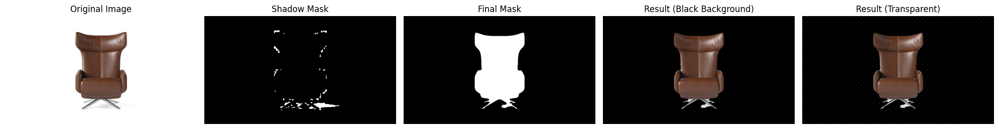

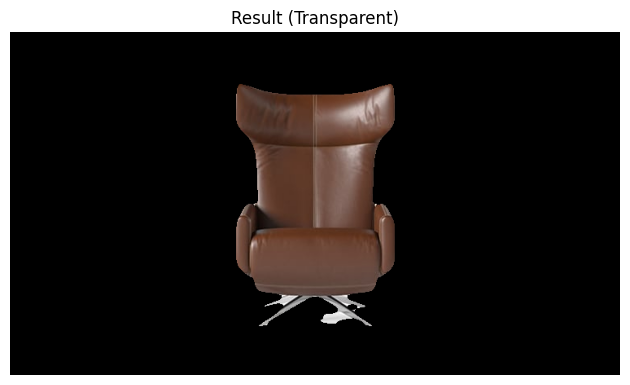

Create mesh complete!!!, total added points:  20865
Loading image...
It's already a numpy array - verify format
Detecting background color...
Detected background color (RGB): (255, 255, 255)
Detecting shadows...
Creating color-based mask...
Preserving white details...
Smoothing edges...
Shrinking mask...


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1474: ConvergenceWarning:

Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.



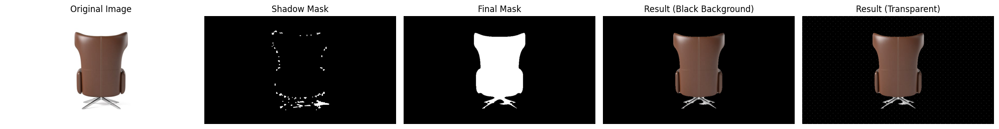

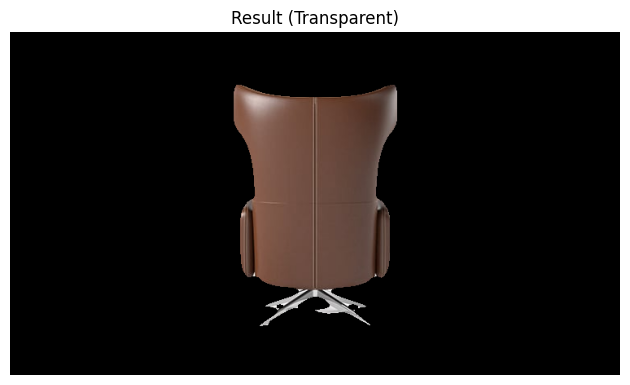

Create mesh complete!!!, total added points:  34611
Loading image...
It's already a numpy array - verify format
Detecting background color...
Detected background color (RGB): (255, 255, 255)
Detecting shadows...
Creating color-based mask...
Preserving white details...
Smoothing edges...
Shrinking mask...


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1474: ConvergenceWarning:

Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.



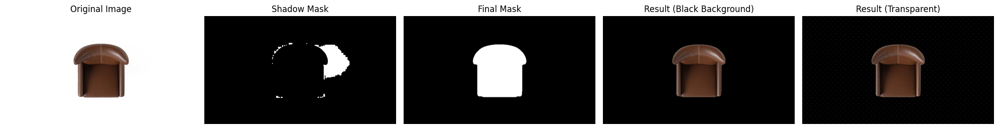

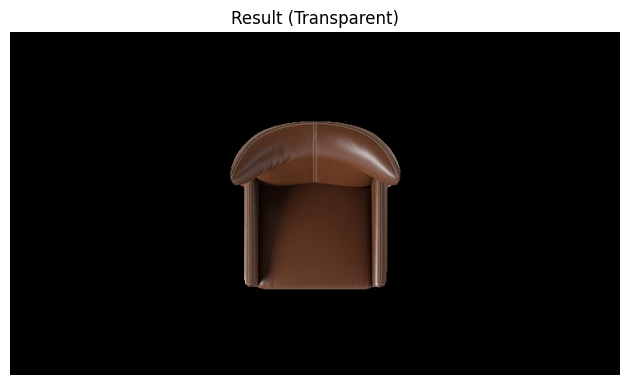

Create mesh complete!!!, total added points:  7443


In [6]:
# First, let's get our three normalized meshes individually
front_fig = create_object_mesh("../static/uploads/Chair/front.jpg", depth_threshold=0.0)
back_fig = create_object_mesh("../static/uploads/Chair/back.jpg", depth_threshold=0.0)
top_fig = create_object_mesh("../static/uploads/Chair/top.jpg", depth_threshold=0.00)

    # For maximum quality (but slower)
combined_mesh = combine_front_back_meshes(front_fig, back_fig, sampling_rate=1, depth_threshold=0.25)
# front_fig.show()
# back_fig.show()
combined_mesh.show()

In [7]:
def combine_meshes_with_3d_alignment(front_fig, back_fig, distance_threshold=0.1):
    """
    Combines front and back meshes using 3D alignment with robust size handling.
    
    Args:
        front_fig: Plotly figure containing front view mesh
        back_fig: Plotly figure containing back view mesh
        distance_threshold: Maximum distance for considering points as corresponding
    """
    def extract_mesh_points(fig):
        """Extract and preprocess points from a mesh figure."""
        if fig is None or not fig.data:
            return None, None
        
        trace = fig.data[0]
        points = np.column_stack((
            np.array(trace.x),
            np.array(trace.y),
            np.array(trace.z)
        ))
        colors = trace.marker.color
        
        # Remove any invalid points
        valid_mask = ~np.any(np.isnan(points), axis=1)
        return points[valid_mask], np.array(colors)[valid_mask]
    
    # Extract points from both meshes
    front_points, front_colors = extract_mesh_points(front_fig)
    back_points, back_colors = extract_mesh_points(back_fig)
    
    print(f"Front points: {len(front_points)}, Back points: {len(back_points)}")
    
    # Normalize both point clouds to similar scale
    def normalize_points(points):
        """Normalize points to unit scale while preserving proportions."""
        center = np.mean(points, axis=0)
        centered = points - center
        scale = np.max(np.abs(centered))
        normalized = centered / scale
        return normalized, center, scale
    
    # Normalize both point clouds
    front_normalized, front_center, front_scale = normalize_points(front_points)
    back_normalized, back_center, back_scale = normalize_points(back_points)
    
    # Sample points if one mesh is much larger than the other
    def sample_points(points, colors, target_size):
        """Sample points to reduce size while maintaining distribution."""
        if len(points) <= target_size:
            return points, colors
        
        indices = np.random.choice(len(points), target_size, replace=False)
        return points[indices], colors[indices]
    
    # Balance point cloud sizes
    target_size = min(len(front_normalized), len(back_normalized))
    front_sampled, front_colors_sampled = sample_points(front_normalized, front_colors, target_size)
    back_sampled, back_colors_sampled = sample_points(back_normalized, back_colors, target_size)
    
    # Find corresponding points using balanced point clouds
    def find_corresponding_points(source, target, threshold):
        """Find corresponding points with adaptive thresholding."""
        from scipy.spatial import cKDTree
        tree = cKDTree(target)
        
        # Use an adaptive threshold based on point cloud size
        adaptive_threshold = threshold * np.sqrt(np.mean(np.var(target, axis=0)))
        
        distances, indices = tree.query(source, k=1)
        valid_matches = distances < adaptive_threshold
        
        return source[valid_matches], target[indices[valid_matches]], valid_matches
    
    # Align normalized point clouds
    back_matched, front_matched, valid_matches = find_corresponding_points(
        back_sampled, front_sampled, distance_threshold)
    
    if len(back_matched) < 3:
        print("Not enough matching points found. Using simple alignment.")
        # Create a simple alignment by mirroring and offsetting
        back_aligned = back_points.copy()
        back_aligned[:, 0] *= -1  # Mirror across YZ plane
        
        # Add an offset to separate front and back
        offset = np.max(front_points[:, 2]) - np.min(back_points[:, 2])
        back_aligned[:, 2] += offset * 1.1  # Add 10% extra spacing
        
    else:
        # Calculate optimal transformation using matched points
        def find_optimal_transform(source, target):
            """Calculate optimal rigid transformation between point sets."""
            # Calculate centroids
            source_centroid = np.mean(source, axis=0)
            target_centroid = np.mean(target, axis=0)
            
            # Center the point sets
            source_centered = source - source_centroid
            target_centered = target - target_centroid
            
            # Calculate covariance matrix
            H = source_centered.T @ target_centered
            
            # Use SVD to find rotation
            U, _, Vt = np.linalg.svd(H)
            R = Vt.T @ U.T
            
            # Ensure right-handed coordinate system
            if np.linalg.det(R) < 0:
                Vt[-1,:] *= -1
                R = Vt.T @ U.T
            
            # Calculate translation
            t = target_centroid - R @ source_centroid
            
            return R, t
        
        # Apply transformation to original back points
        R, t = find_optimal_transform(back_matched, front_matched)
        back_aligned = (R @ back_points.T).T + t
    
    # Combine the point clouds
    combined_points = np.vstack([front_points, back_aligned])
    combined_colors = np.concatenate([front_colors, back_colors])
    
    # Create visualization
    combined_fig = go.Figure(data=[go.Scatter3d(
        x=combined_points[:, 0],
        y=combined_points[:, 1],
        z=combined_points[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=combined_colors,
            opacity=1
        )
    )])
    
    # Set layout
    combined_fig.update_layout(
        scene=dict(
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5),
                up=dict(x=0, y=0, z=1)
            )
        ),
        showlegend=False
    )
    
    return combined_fig

# Usage with more conservative threshold
combined_mesh = combine_meshes_with_3d_alignment(front_fig, back_fig, distance_threshold=0.1)
combined_mesh.show()

Front points: 20865, Back points: 34611


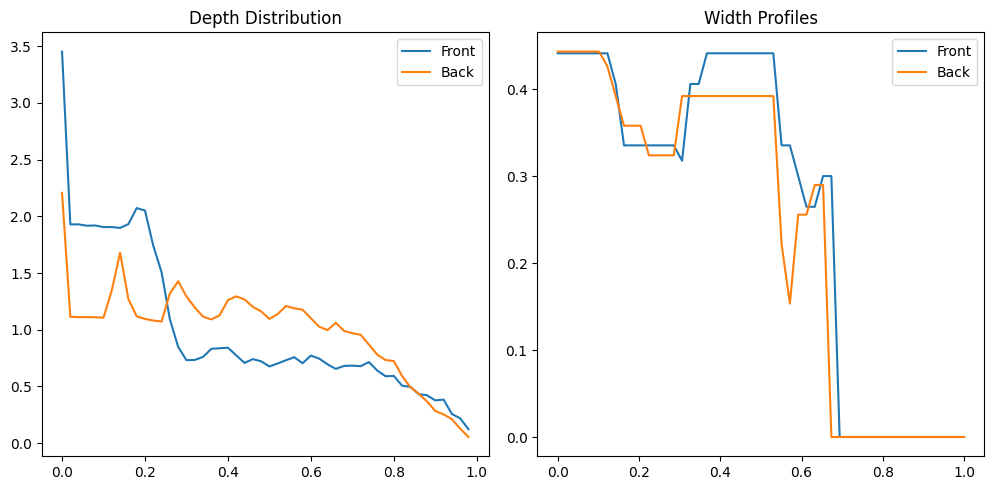

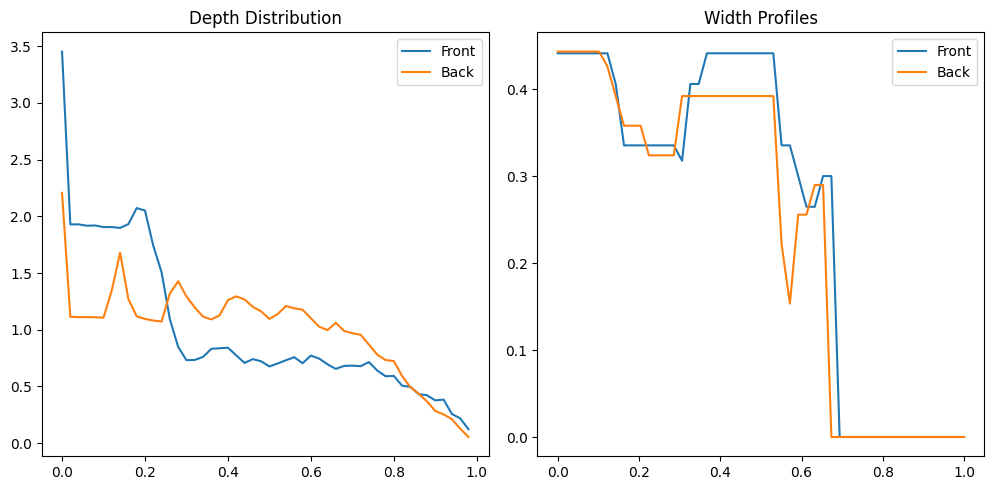

In [8]:
import numpy as np
from scipy.optimize import minimize
from scipy.spatial import cKDTree
import plotly.graph_objects as go
import matplotlib.pyplot as plt

class MeshAnalyzer:
    """
    A class to analyze and align 3D mesh structures using orthogonal views.
    This implementation focuses on general 3D objects, not specific to any shape.
    """
    def __init__(self, front_mesh, back_mesh, top_mesh=None):
        # Store our mesh data
        self.front_points = self._extract_points(front_mesh)
        self.back_points = self._extract_points(back_mesh)
        self.top_points = self._extract_points(top_mesh) if top_mesh else None
        
        # Initialize our analysis parameters
        self.height_bins = 50  # Number of height levels to analyze
        self.depth_bins = 50   # Number of depth sections to analyze
        
    def _extract_points(self, mesh_fig):
        """
        Extracts point coordinates from a Plotly mesh figure.
        Returns normalized points for consistent analysis.
        """
        if mesh_fig is None or not mesh_fig.data:
            return None
            
        trace = mesh_fig.data[0]
        points = np.column_stack((
            np.array(trace.x),
            np.array(trace.y),
            np.array(trace.z)
        ))
        
        # Normalize points to unit cube while preserving aspect ratio
        points = self._normalize_points(points)
        return points
    
    def _normalize_points(self, points):
        """
        Normalizes points to unit cube while preserving relative proportions.
        This ensures consistent analysis regardless of original scale.
        """
        min_vals = np.min(points, axis=0)
        max_vals = np.max(points, axis=0)
        scale = np.max(max_vals - min_vals)
        
        normalized = (points - min_vals) / scale
        return normalized
    
    def analyze_depth_distribution(self, points, n_bins=50):
        """
        Analyzes how points are distributed across different depths.
        This helps us understand the object's structure along the z-axis.
        """
        depths = points[:, 2]
        hist, bins = np.histogram(depths, bins=n_bins, density=True)
        return hist, bins
    
    def compute_cross_section_profile(self, points, height):
        """
        Computes the cross-section profile at a given height.
        This helps us understand how the object's shape changes vertically.
        """
        # Select points near the given height
        tolerance = 0.02  # Adjustable tolerance for point selection
        level_points = points[np.abs(points[:, 1] - height) < tolerance]
        
        if len(level_points) < 3:  # Need at least 3 points for a meaningful profile
            return None
            
        # Compute the profile metrics
        width = np.max(level_points[:, 0]) - np.min(level_points[:, 0])
        depth = np.max(level_points[:, 2]) - np.min(level_points[:, 2])
        
        return {
            'width': width,
            'depth': depth,
            'density': len(level_points),
            'points': level_points
        }
    
    def compute_alignment_metrics(self):
        """
        Computes various metrics to evaluate and guide mesh alignment.
        Returns a dictionary of metrics that describe how well the meshes match.
        """
        metrics = {}
        
        # Compute depth distribution similarity
        front_hist, _ = self.analyze_depth_distribution(self.front_points)
        back_hist, _ = self.analyze_depth_distribution(self.back_points)
        
        # Distribution similarity score
        metrics['depth_distribution'] = np.sum(np.minimum(front_hist, back_hist))
        
        # Compute profile consistency across heights
        heights = np.linspace(0, 1, self.height_bins)
        profile_scores = []
        
        for height in heights:
            front_profile = self.compute_cross_section_profile(self.front_points, height)
            back_profile = self.compute_cross_section_profile(self.back_points, height)
            
            if front_profile and back_profile:
                # Compare width ratios at this height
                width_ratio = min(front_profile['width'], back_profile['width']) / \
                            max(front_profile['width'], back_profile['width'])
                profile_scores.append(width_ratio)
        
        metrics['profile_consistency'] = np.mean(profile_scores) if profile_scores else 0
        
        return metrics
    
    def visualize_analysis(self):
        """
        Creates visualizations to help understand the analysis results.
        This is crucial for debugging and refining the algorithm.
        """
        fig = plt.figure(figsize=(15, 5))
        
        # Plot depth distributions
        plt.subplot(131)
        front_hist, front_bins = self.analyze_depth_distribution(self.front_points)
        back_hist, back_bins = self.analyze_depth_distribution(self.back_points)
        
        plt.plot(front_bins[:-1], front_hist, label='Front')
        plt.plot(back_bins[:-1], back_hist, label='Back')
        plt.title('Depth Distribution')
        plt.legend()
        
        # Plot width profiles
        plt.subplot(132)
        heights = np.linspace(0, 1, self.height_bins)
        front_widths = []
        back_widths = []
        
        for height in heights:
            front_profile = self.compute_cross_section_profile(self.front_points, height)
            back_profile = self.compute_cross_section_profile(self.back_points, height)
            
            front_widths.append(front_profile['width'] if front_profile else 0)
            back_widths.append(back_profile['width'] if back_profile else 0)
        
        plt.plot(heights, front_widths, label='Front')
        plt.plot(heights, back_widths, label='Back')
        plt.title('Width Profiles')
        plt.legend()
        
        plt.tight_layout()
        return fig

def test_mesh_analysis():
    """
    Test function to demonstrate and validate the mesh analysis implementation.
    """
    # First, let's create some test data
    def create_test_mesh(points):
        return go.Figure(data=[go.Scatter3d(
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode='markers',
            marker=dict(size=2)
        )])
    
    # Create synthetic test data
    n_points = 1000
    
    # Front view test data
    front_points = np.random.rand(n_points, 3)
    front_points[:, 2] *= 0.3  # Compress depth
    front_mesh = create_test_mesh(front_points)
    front_mesh.show()
    
    # Back view test data
    back_points = np.random.rand(n_points, 3)
    back_points[:, 2] = 1 - back_points[:, 2] * 0.3  # Mirror and compress depth
    back_mesh = create_test_mesh(back_points)
    back_mesh.show()
    
    # Create analyzer instance
    analyzer = MeshAnalyzer(front_mesh, back_mesh)
    
    # Compute metrics
    metrics = analyzer.compute_alignment_metrics()
    print("\nAlignment Metrics:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")
    
    # Create visualizations
    viz_fig = analyzer.visualize_analysis()
    # viz_fig.show()
    plt.show()
    
    return analyzer, metrics

# Run the test
# Using your existing mesh data
analyzer = MeshAnalyzer(front_fig, back_fig, top_fig)
metrics = analyzer.compute_alignment_metrics()
analyzer.visualize_analysis()

In [9]:
def combine_meshes_with_top_profile(front_fig, back_fig, top_fig):
    """
    Combines front and back meshes using the top view as the definitive reference 
    for spatial distribution. This ensures the combined view matches the top-down perspective.
    """
    def extract_mesh_points(fig):
        """
        Extracts points and their colors from a Plotly mesh figure while preserving 
        the crucial spatial relationships.
        """
        trace = fig.data[0]
        points = np.column_stack((
            np.array(trace.x),
            np.array(trace.y),
            np.array(trace.z)
        ))
        colors = np.array([c.strip('rgb()').split(',') for c in trace.marker.color])
        return points, colors
    
    def analyze_top_profile(top_points, resolution=100):
        """
        Creates a detailed mapping of width distribution from the top view.
        At each height level, we calculate both the width and the center line.
        """
        height_levels = np.linspace(np.min(top_points[:, 1]), 
                                  np.max(top_points[:, 1]), 
                                  resolution)
        profile = []
        
        for height in height_levels:
            # Get points at this height level
            slice_mask = np.abs(top_points[:, 1] - height) < (height_levels[1] - height_levels[0])
            slice_points = top_points[slice_mask]
            
            if len(slice_points) > 0:
                # In top view, x coordinates represent width distribution
                left_edge = np.min(slice_points[:, 0])
                right_edge = np.max(slice_points[:, 0])
                center_line = (left_edge + right_edge) / 2
                width = right_edge - left_edge
                
                profile.append({
                    'height': height,
                    'center': center_line,
                    'width': width,
                    'left': left_edge,
                    'right': right_edge
                })
        
        return profile
    
    def redistribute_points(points, profile, is_front=True):
        """
        Redistributes points to match the top view profile while maintaining
        relative spatial relationships within each view.
        """
        from scipy.interpolate import interp1d
        
        # Create interpolation functions for the profile
        heights = np.array([p['height'] for p in profile])
        centers = np.array([p['center'] for p in profile])
        widths = np.array([p['width'] for p in profile])
        
        center_interpolator = interp1d(heights, centers, kind='linear', 
                                     fill_value='extrapolate')
        width_interpolator = interp1d(heights, widths, kind='linear',
                                    fill_value='extrapolate')
        
        # Adjust each point's position
        adjusted_points = points.copy()
        for i in range(len(points)):
            height = points[i, 1]
            
            # Get profile information for this height
            local_width = width_interpolator(height)
            local_center = center_interpolator(height)
            
            # Calculate relative position in original depth
            depth_range = np.max(points[:, 2]) - np.min(points[:, 2])
            relative_depth = (points[i, 2] - np.min(points[:, 2])) / depth_range
            
            # Adjust z-coordinate (depth) based on top view profile
            if is_front:
                adjusted_points[i, 2] = local_center + (local_width/2) * relative_depth
            else:
                adjusted_points[i, 2] = local_center - (local_width/2) * relative_depth
        
        return adjusted_points
    
    # Extract points from all views
    front_points, front_colors = extract_mesh_points(front_fig)
    back_points, back_colors = extract_mesh_points(back_fig)
    top_points, _ = extract_mesh_points(top_fig)
    
    # Analyze the top view profile
    profile = analyze_top_profile(top_points)
    
    # Redistribute front and back points according to top view
    front_adjusted = redistribute_points(front_points, profile, is_front=True)
    back_adjusted = redistribute_points(back_points, profile, is_front=False)
    
    # Combine the adjusted points
    combined_points = np.vstack([front_adjusted, back_adjusted])
    combined_colors = [f'rgb({r},{g},{b})' for r,g,b in np.vstack([front_colors, back_colors])]
    
    # Create the combined visualization
    combined_fig = go.Figure(data=[go.Scatter3d(
        x=combined_points[:, 0],
        y=combined_points[:, 1],
        z=combined_points[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=combined_colors,
            opacity=1
        )
    )])
    
    # Update layout with better viewing angles
    combined_fig.update_layout(
        scene=dict(
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5),
                up=dict(x=0, y=0, z=1)
            )
        ),
        showlegend=False
    )
    
    return combined_fig

# Usage
combined_mesh = combine_meshes_with_top_profile(front_fig, back_fig, top_fig)
combined_mesh.show()

In [10]:
def analyze_depth_distribution(front_fig, back_fig, top_fig):
    """
    Analyzes the depth distribution between front and back views and compares it 
    with the top view profile. This function focuses on understanding the ratios
    rather than implementing the scaling.
    """
    def extract_mesh_points(fig):
        trace = fig.data[0]
        return np.column_stack((
            np.array(trace.x),
            np.array(trace.y),
            np.array(trace.z)
        ))

    def analyze_slice(points, height, margin=0.01):
        """
        Analyzes a horizontal slice of points at a given height.
        Returns the depth range and center point of that slice.
        """
        slice_points = points[np.abs(points[:, 1] - height) < margin]
        if len(slice_points) < 3:  # Need at least 3 points for meaningful analysis
            return None
            
        depth_min = np.min(slice_points[:, 2])
        depth_max = np.max(slice_points[:, 2])
        depth_range = depth_max - depth_min
        center = (depth_max + depth_min) / 2
        
        return {
            'min': depth_min,
            'max': depth_max,
            'range': depth_range,
            'center': center
        }

    # Extract points from all views
    front_points = extract_mesh_points(front_fig)
    back_points = extract_mesh_points(back_fig)
    top_points = extract_mesh_points(top_fig)

    # Analyze depth distributions at different heights
    height_min = max(np.min(front_points[:, 1]), np.min(back_points[:, 1]))
    height_max = min(np.max(front_points[:, 1]), np.max(back_points[:, 1]))
    
    # Sample heights where we have data in all views
    heights = np.linspace(height_min, height_max, 20)
    
    print("\nDepth Distribution Analysis:")
    print("-" * 50)
    print("Height | Front Depth | Back Depth | Top View Width | Front:Back Ratio")
    print("-" * 50)

    for height in heights:
        # Analyze each view at this height
        front_slice = analyze_slice(front_points, height)
        back_slice = analyze_slice(back_points, height)
        top_slice = analyze_slice(top_points, height)
        
        if front_slice and back_slice and top_slice:
            # Calculate actual depth ranges
            front_depth = front_slice['range']
            back_depth = back_slice['range']
            total_actual_depth = front_depth + back_depth
            
            # Calculate proportions
            if total_actual_depth > 0:
                front_ratio = front_depth / total_actual_depth
                back_ratio = back_depth / total_actual_depth
                
                # Get target width from top view
                top_width = top_slice['range']
                
                print(f"{height:6.2f} | {front_depth:10.2f} | {back_depth:9.2f} | "
                      f"{top_width:12.2f} | {front_ratio:0.2f}:{back_ratio:0.2f}")
                
                # Calculate how much we need to scale to match top view
                scale_factor = top_width / total_actual_depth
                if scale_factor != 1.0:
                    print(f"         Scale factor needed: {scale_factor:0.2f}")
                    print(f"         Target depths - Front: {front_depth * scale_factor:0.2f}, "
                          f"Back: {back_depth * scale_factor:0.2f}")
    
    print("-" * 50)
    print("\nAnalysis Summary:")
    print("1. The ratios show how the depth is currently distributed between front and back views")
    print("2. The scale factor shows how much we need to adjust to match the top view width")
    print("3. Target depths show what the front and back depths should be while maintaining their ratio")

# Usage
depth_analysis = analyze_depth_distribution(front_fig, back_fig, top_fig)


Depth Distribution Analysis:
--------------------------------------------------
Height | Front Depth | Back Depth | Top View Width | Front:Back Ratio
--------------------------------------------------
 15.00 |      16.47 |     58.23 |        20.72 | 0.22:0.78
         Scale factor needed: 0.28
         Target depths - Front: 4.57, Back: 16.15
 17.00 |      14.86 |     57.43 |        26.69 | 0.21:0.79
         Scale factor needed: 0.37
         Target depths - Front: 5.49, Back: 21.21
 19.00 |      13.25 |     56.22 |        28.69 | 0.19:0.81
         Scale factor needed: 0.41
         Target depths - Front: 5.47, Back: 23.21
 21.00 |      13.65 |     55.42 |        28.29 | 0.20:0.80
         Scale factor needed: 0.41
         Target depths - Front: 5.59, Back: 22.70
 23.00 |      14.06 |     54.22 |        19.92 | 0.21:0.79
         Scale factor needed: 0.29
         Target depths - Front: 4.10, Back: 15.82
 25.00 |      14.06 |     53.01 |        11.95 | 0.21:0.79
         Scale fact